In [3]:
import numpy as np
import pandas as pd


In [4]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler

In [8]:
df = pd.read_csv('archive/data.csv', delimiter=',')

In [9]:
df = df.drop(['Unnamed: 0'], axis = 1)
df.shape

(18249, 13)

In [25]:
df = df.replace('?', np.NaN)

In [26]:
df = df.dropna()

In [27]:
df['type'] = pd.Categorical(df['type'])

In [28]:
num_df = df.select_dtypes(include='float64').copy()
num_df['y'] = df['type'].cat.codes

In [29]:
for column in num_df.columns:
    scale = StandardScaler().fit(num_df[[column]])
    num_df[[column]] = scale.transform(num_df[[column]])

#  PCA

In [30]:
pca = PCA(n_components=3)
pca_result = pca.fit_transform(num_df.values)
num_df['PCA1'] = pca_result[:,0]
num_df['PCA2'] = pca_result[:,1] 
num_df['PCA3'] = pca_result[:,2]

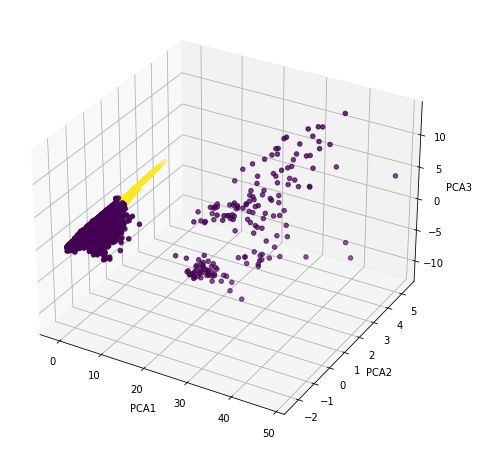

In [31]:
aX = plt.figure(figsize=(14,8)).gca(projection='3d')
aX.scatter(
    xs=num_df["PCA1"], 
    ys=num_df["PCA2"], 
    zs=num_df["PCA3"], 
    c=num_df["y"]
)
aX.set_xlabel('PCA1')
aX.set_ylabel('PCA2')
aX.set_zlabel('PCA3')
plt.show()

<AxesSubplot:xlabel='PCA1', ylabel='PCA2'>

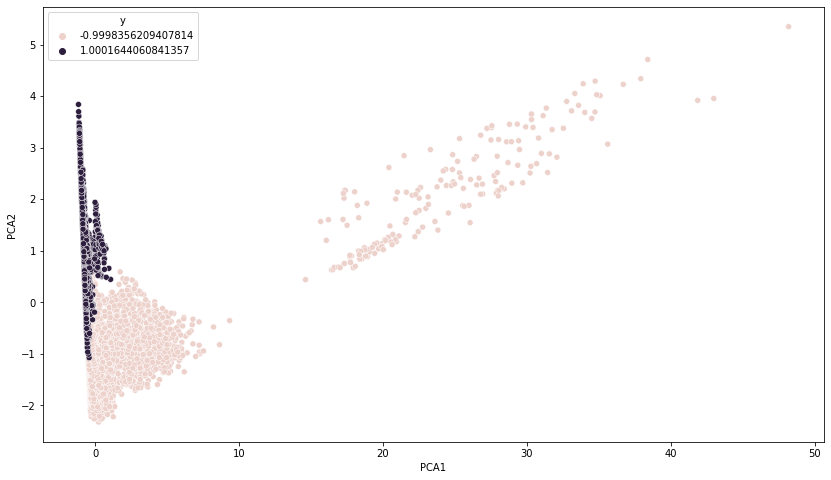

In [33]:
plt.figure(figsize=(14,8))
sns.scatterplot(
    x="PCA1", y="PCA2",
    hue="y",
    data=num_df,)


# TSNE


In [34]:
n=2
P=40
I=500
tsne = TSNE(n_components=n, perplexity=P, n_iter=I)
tsne_results = tsne.fit_transform(num_df)

<AxesSubplot:xlabel='TSNE1', ylabel='TSNE2'>

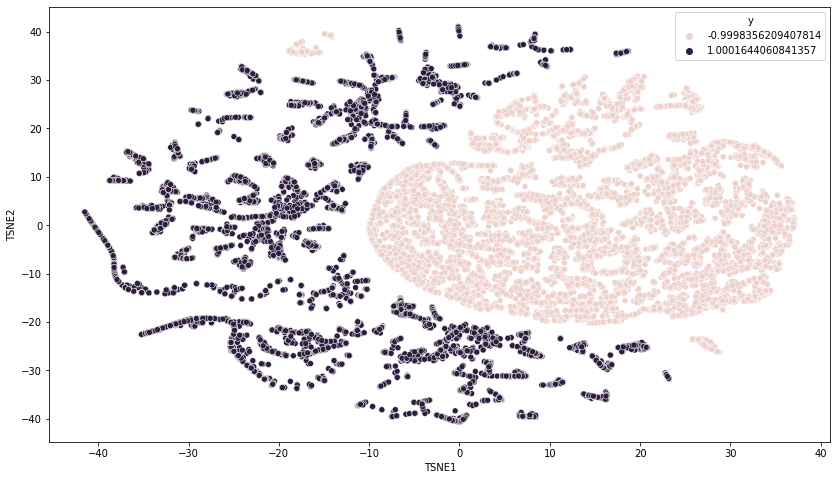

In [35]:
num_df['TSNE1'] = tsne_results[:,0]
num_df['TSNE2'] = tsne_results[:,1]
plt.figure(figsize=(14,8))
sns.scatterplot(
    x="TSNE1", y="TSNE2",
    hue="y",
    data=num_df,
)

# cluster analysis

In [37]:
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.cluster import KMeans

def recreate_image(codebook, labels, w, h):
    d = codebook.shape[1]
    image = np.zeros((w, h, d))
    label_idx = 0
    for i in range(w):
        for j in range(h):
            image[i][j] = codebook[labels[label_idx]]
            label_idx += 1
    return image



In [51]:
image = Image.open('image.jpg')
image = np.array(image, dtype=np.float64) / 255

In [46]:
N_COLORS = [64, 32, 16, 8]
SUBSAMPLE_SIZE = 0.01

In [52]:
w, h, d = tuple(image.shape)
image_array = np.reshape(image, (w * h, d))
img_subsample = image_array[np.random.choice(w * h, int(w * h * SUBSAMPLE_SIZE)), :]

In [53]:
models = []
for colors in N_COLORS:
    kmeans = KMeans(n_clusters=colors).fit(img_subsample)
    models.append(kmeans)
    

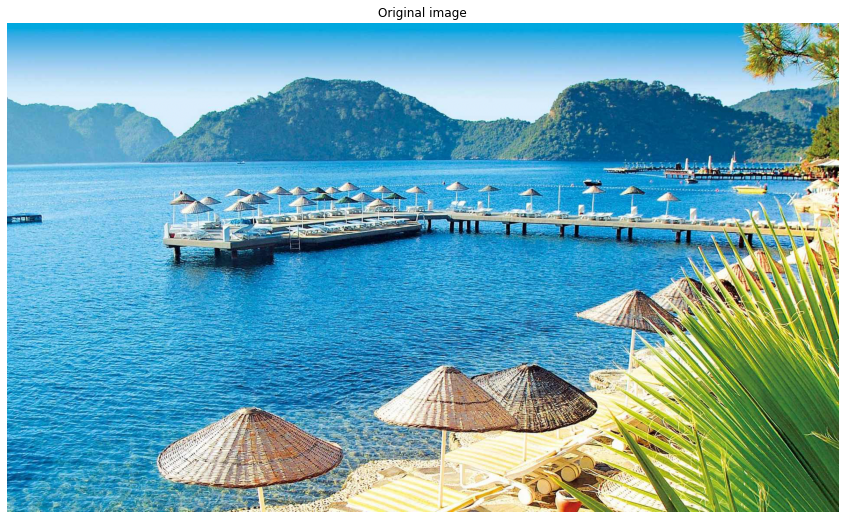

In [54]:
plt.figure(figsize=(16,9))
plt.axis('off')
plt.title('Original image')
plt.imshow(image) 

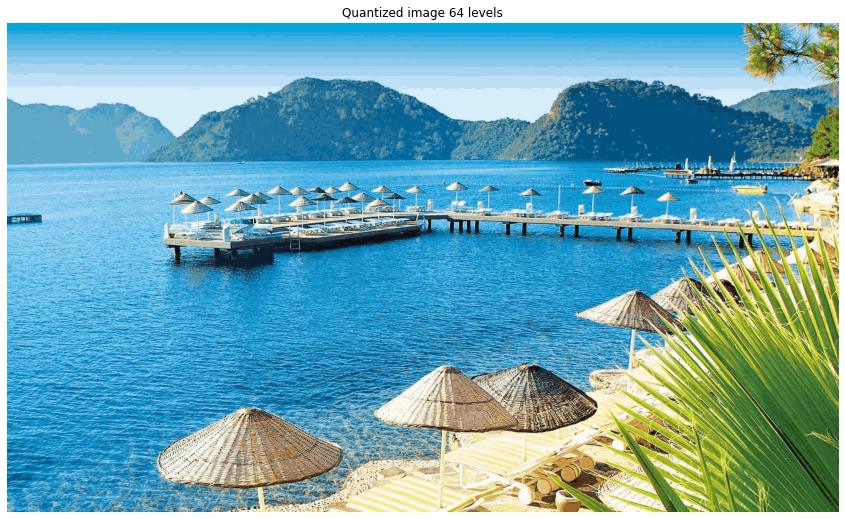

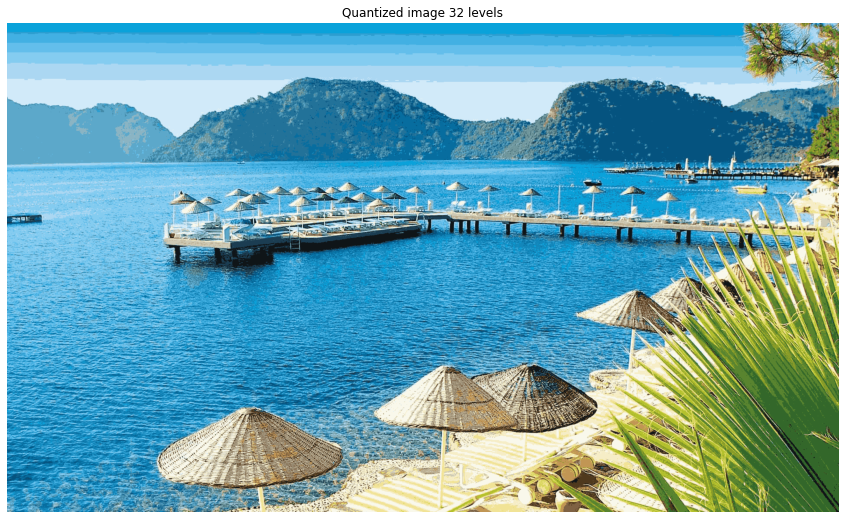

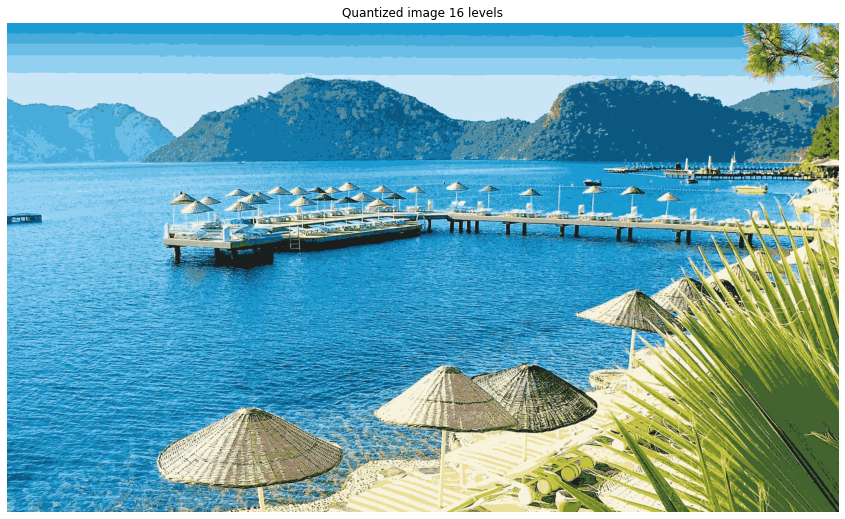

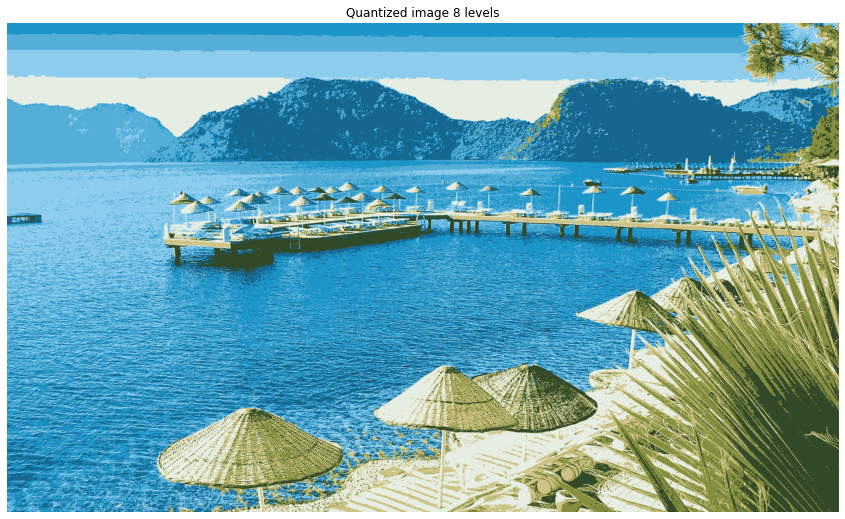

In [55]:
for model in models:
    labels = model.predict(image_array)
    plt.figure(figsize=(16,9))
    plt.clf()
    plt.axis('off')
    plt.title(f'Quantized image {model.get_params().get("n_clusters")} levels')
    plt.imshow(recreate_image(model.cluster_centers_, labels, w, h))

# 2 - generate data and graph

In [30]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.pyplot as plt
import matplotlib.cm as cm

X, y = make_blobs(n_samples=500,
                  n_features=2,
                  centers=4,
                  shuffle=True,
                  random_state=1)

range_n_clusters = [3, 4, 5]


In [31]:
def aggregate_sort_scores(ax1, n_clusters, y_lower, cluster_labels, sample_silhouette_values):
    for i in range(n_clusters):
        # Aggregate scores for samples and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10

In [36]:
def do_work(n_clusters):
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n =", n_clusters,
          "AVG is :", silhouette_avg)

    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    aggregate_sort_scores(ax1, n_clusters, y_lower, cluster_labels,sample_silhouette_values)

    ax1.set_title("The silhouette pl for the various clusters.")
    ax1.set_xlabel("coefficient values")
    ax1.set_ylabel("Cluster lbl")

    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])
    ax1.set_xticks([-0.1, 0, 0.25, 0.5, 0.8, 0.95, 1.1])

    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    centers = clusterer.cluster_centers_
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("Visual.")
    ax2.set_xlabel("F space for the 1st feature")
    ax2.set_ylabel("F space for the 2nd feature")

    plt.suptitle((f"Analysis for KMeans with n_clusters = {n_clusters}"),
                 fontsize=14, fontweight='bold')


For n = 3 AVG is : 0.5882004012129721
For n = 4 AVG is : 0.6505186632729437
For n = 5 AVG is : 0.5745566973301872


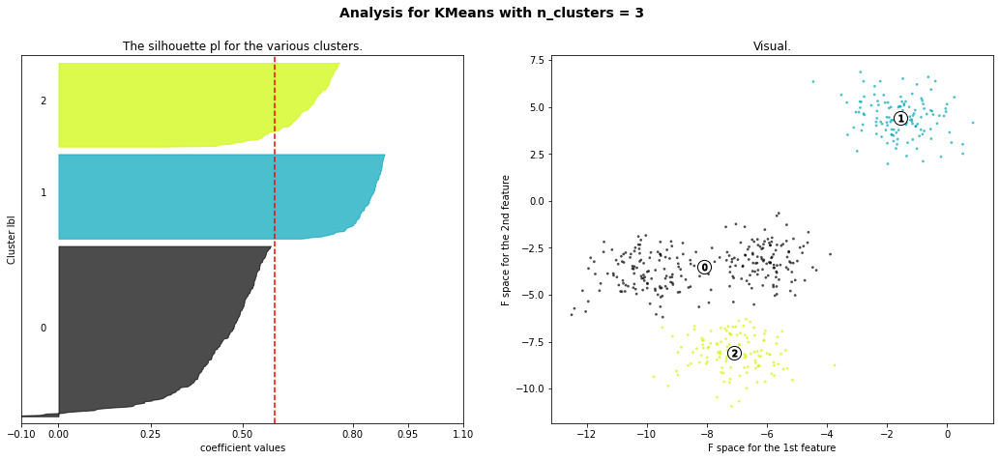

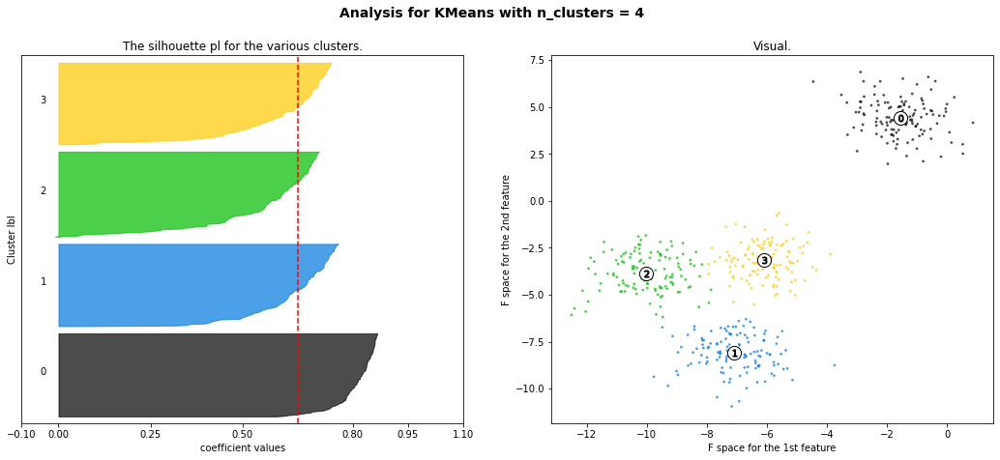

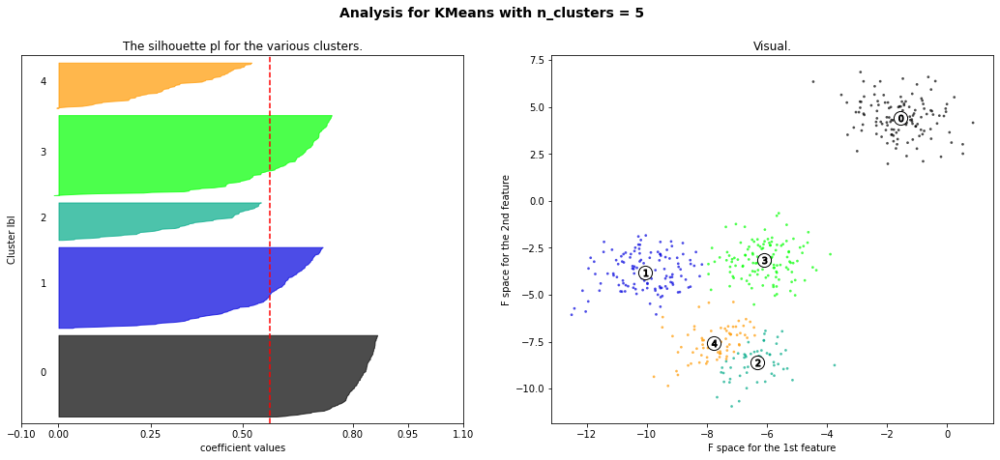

In [37]:
for n_clusters in range_n_clusters:
    do_work(n_clusters)
plt.show()

3 і 6 +- однаково не підходять
В цьому випадку даних скоріше за все не 5 кластерів, бо в третьому графіку аж 2 кластери
з коефіцієнтом менше середнього по всіх, також дуже відрізняються розміри.
Для 3 занадто великий розмір одного з кластерів і значення менше середнього.
Для 4 - результат хороший, а 3 тільки трошки краще за 6.
silhouette - показує наскільки точки кластера знаходяться близько до точок свого кластера 
ніж то точок з іншого найближчого. Також показує розмір кластера.


# EM alg

In [39]:
from sklearn.mixture import GaussianMixture


In [43]:
mean1 = [0, 0]
cov1 = [[1, 0],
        [0, 1]]


In [44]:
mean2 = [5, 5]
cov2 = [[2, 0],
        [0, 2]]

In [45]:
x1 = np.random.default_rng().multivariate_normal(mean1, cov1, 1000)
x2 = np.random.default_rng().multivariate_normal(mean2, cov2, 1000)
df = np.vstack([x1,x2])

In [46]:
gm = GaussianMixture(n_components=2, covariance_type='diag')
labels = gm.fit_predict(df)

<AxesSubplot:>

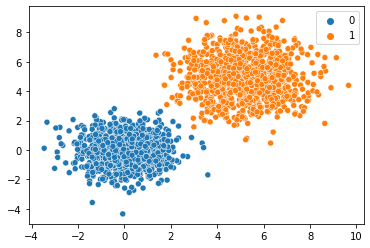

In [47]:
sns.scatterplot(x=df[:,0], y=df[:,1], hue=labels)

In [48]:
gm.covariances_[0]

array([1.024693  , 0.99298355])

In [50]:
x1 = np.random.default_rng().multivariate_normal(gm.means_[0], np.diag(gm.covariances_[0]), 1000)


In [51]:
x2 = np.random.default_rng().multivariate_normal(gm.means_[1], np.diag(gm.covariances_[1]), 1000)


In [52]:
df = np.vstack([x1,x2])

<AxesSubplot:>

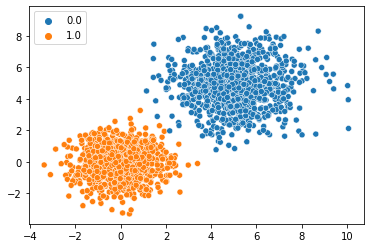

In [53]:
sns.scatterplot(x=df[:,0], y=df[:,1], hue=np.hstack([np.ones((1000)),np.zeros((1000))]))

# Text data

In [5]:
import string
import pandas as pd
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB

In [6]:
pd.set_option('max_colwidth', 2000)

In [7]:
data = pd.read_csv('archive/JEOPARDY.csv') # https://www.kaggle.com/tunguz/200000-jeopardy-questions

In [8]:
data

,Show Number,Air Date,Round,Category,Value,Question,Answer
0,4680,2004-12-31,Jeopardy!,HISTORY,$200,"For the last 8 years of his life, Galileo was under house arrest for espousing this man's theory",Copernicus
1,4680,2004-12-31,Jeopardy!,ESPN's TOP 10 ALL-TIME ATHLETES,$200,"No. 2: 1912 Olympian; football star at Carlisle Indian School; 6 MLB seasons with the Reds, Giants & Braves",Jim Thorpe
2,4680,2004-12-31,Jeopardy!,EVERYBODY TALKS ABOUT IT...,$200,"The city of Yuma in this state has a record average of 4,055 hours of sunshine each year",Arizona
3,4680,2004-12-31,Jeopardy!,THE COMPANY LINE,$200,"In 1963, live on ""The Art Linkletter Show"", this company served its billionth burger",McDonald's
4,4680,2004-12-31,Jeopardy!,EPITAPHS & TRIBUTES,$200,"Signer of the Dec. of Indep., framer of the Constitution of Mass., second President of the United States",John Adams
...,...,...,...,...,...,...,...
216925,4999,2006-05-11,Double Jeopardy!,RIDDLE ME THIS,$2000,This Puccini opera turns on the solution to 3 riddles posed by the heroine,Turandot
216926,4999,2006-05-11,Double Jeopardy!,"""T"" BIRDS",$2000,"In North America this term is properly applied to only 4 species that are crested, including the tufted",a titmouse
216927,4999,2006-05-11,Double Jeopardy!,AUTHORS IN THEIR YOUTH,$2000,"In Penny Lane, where this ""Hellraiser"" grew up, the barber shaves another customer--then flays him alive!",Clive Barker
216928,4999,2006-05-11,Double Jeopardy!,QUOTATIONS,$2000,"From Ft. Sill, Okla. he made the plea, Arizona is my land, my home, my father's land, to which I now ask to... return""",Geronimo


In [9]:
del data['Show Number'], data[' Air Date'], data[' Value'], data[' Answer']

In [10]:
data


,Round,Category,Question
0,Jeopardy!,HISTORY,"For the last 8 years of his life, Galileo was under house arrest for espousing this man's theory"
1,Jeopardy!,ESPN's TOP 10 ALL-TIME ATHLETES,"No. 2: 1912 Olympian; football star at Carlisle Indian School; 6 MLB seasons with the Reds, Giants & Braves"
2,Jeopardy!,EVERYBODY TALKS ABOUT IT...,"The city of Yuma in this state has a record average of 4,055 hours of sunshine each year"
3,Jeopardy!,THE COMPANY LINE,"In 1963, live on ""The Art Linkletter Show"", this company served its billionth burger"
4,Jeopardy!,EPITAPHS & TRIBUTES,"Signer of the Dec. of Indep., framer of the Constitution of Mass., second President of the United States"
...,...,...,...
216925,Double Jeopardy!,RIDDLE ME THIS,This Puccini opera turns on the solution to 3 riddles posed by the heroine
216926,Double Jeopardy!,"""T"" BIRDS","In North America this term is properly applied to only 4 species that are crested, including the tufted"
216927,Double Jeopardy!,AUTHORS IN THEIR YOUTH,"In Penny Lane, where this ""Hellraiser"" grew up, the barber shaves another customer--then flays him alive!"
216928,Double Jeopardy!,QUOTATIONS,"From Ft. Sill, Okla. he made the plea, Arizona is my land, my home, my father's land, to which I now ask to... return"""


In [11]:
data[' Category'] = data[' Category'].str.lower()
data[' Category'] = data[' Category'].str.strip()

number->tokens

In [12]:
data[' Category'] = data[' Category'].str.replace('\d+','NBR', regex=True)

In [13]:
stopwords_ = stopwords.words('english')

In [14]:
data[' Category'] = data[' Category'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stopwords_)]))

In [15]:
tb = str.maketrans('', '', string.punctuation)
data[' Category'] = data[' Category'].str.translate(tb)

In [16]:
data[' Category'].value_counts()

NBRletter words          1367
NBR                      1008
                          941
NBRs                      611
science                   551
                         ... 
streisand films             1
cast ten commandments       1
space shuttle               1
literary botany             1
biblical kings              1
Name:  Category, Length: 25529, dtype: int64

In [17]:
data[' Category'] = data[' Category'].apply(
    lambda x: ' '.join([WordNetLemmatizer().lemmatize(word) for word in x.split()])
)


In [18]:
def wordcloud(text):
    wordcloud = WordCloud(background_color = 'black').generate(str(text))
    fig = plt.figure(
        figsize = (40, 30))
    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.show()

In [19]:
categories = data[' Round'].unique()
categories

array(['Jeopardy!', 'Double Jeopardy!', 'Final Jeopardy!', 'Tiebreaker'],
      dtype=object)

map for round== Jeopardy!


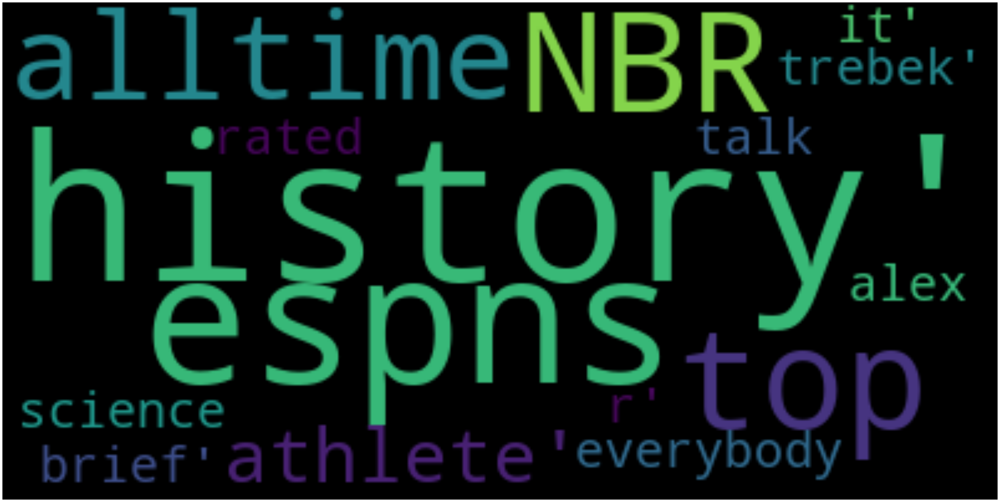

map for round== Double Jeopardy!


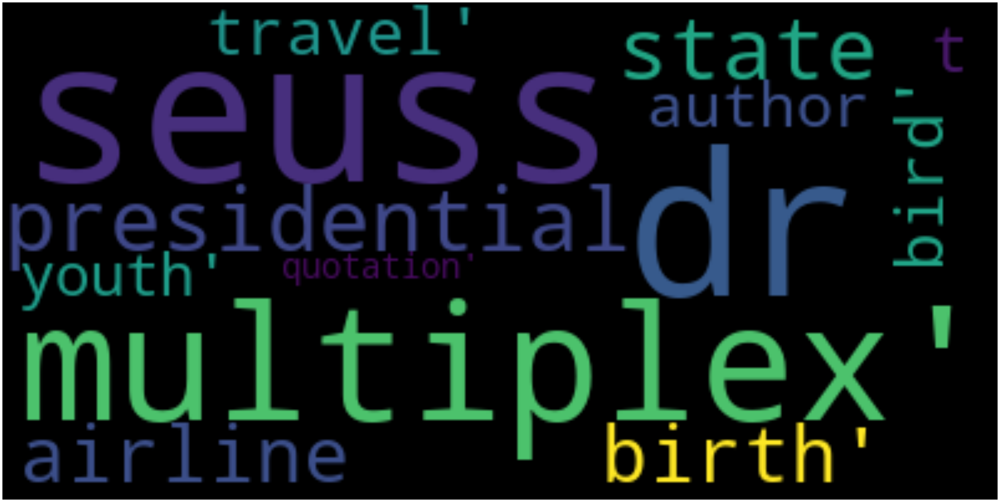

map for round== Final Jeopardy!


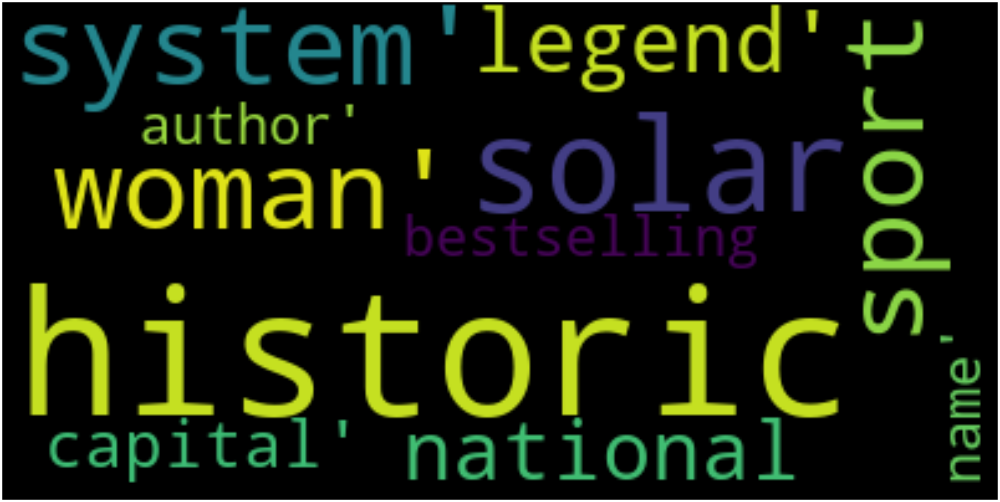

map for round== Tiebreaker


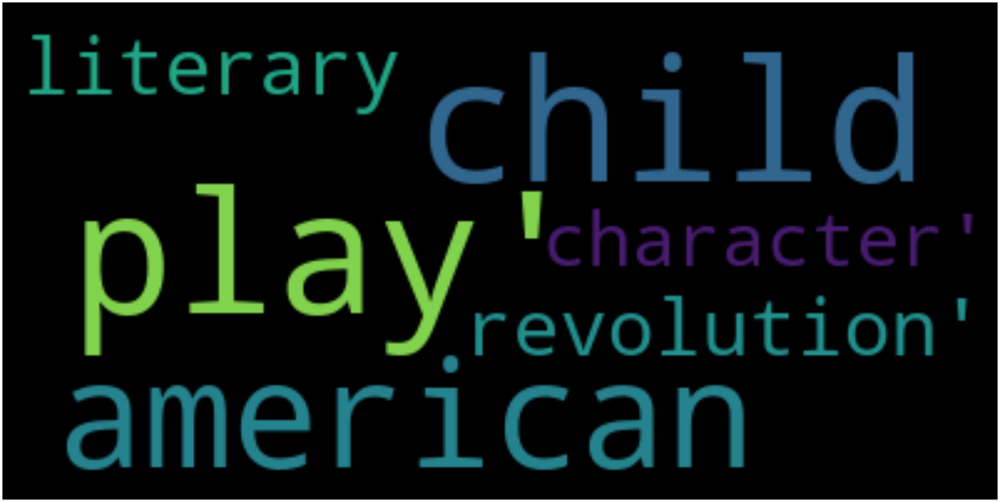

In [21]:
for c in categories:
    print('map for round==', c)
    wordcloud(data[data[' Round']==c][' Category'].values)

In [206]:
# extract features:


In [23]:
X = TfidfVectorizer(max_features=8000).fit_transform(data[' Category'])
y = data[' Round']

In [24]:
# classificate:

In [25]:
X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [26]:
model = MultinomialNB().fit(X_train, y_train)
predi = model.predict(X_test)

In [27]:
from sklearn.metrics import accuracy_score
print(f"accuracy: {format(round(accuracy_score(y_test, predi)*100,2))}%")

accuracy: 65.36%


In [ ]:
Якщо вгадувати категорію за питанням - то задача цікавіша, але тут занадто багато категорій і мало питань - точність вийшла +-3.5%